# **Credit Score Model**

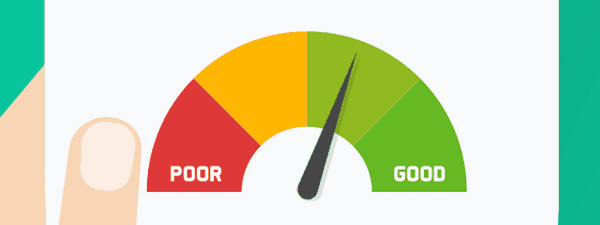



* **Objective:**
* The objective of this project is to develop an automated credit score classification system using deep learning and machine learning techniques to predict creditworthiness accurately.

* **Methodology:**
* The proposed system will use both deep learning and machine learning algorithms to classify three credit scores i.e Standard, Good and Poor.
* The system will be trained on a dataset of historical credit scores, which will include features such as credit history, income, employment status, and debt-to-income ratio.
* The system will employ several techniques to improve the accuracy of credit score classification, including data preprocessing, feature engineering, and model tuning.
* Deep learning algorithms, such as neural networks, will be used to capture complex relationships between variables, while machine learning algorithms, such as decision trees and logistic regression, will be used to identify important features.
* The system will be tested using a separate test dataset to evaluate its accuracy and generalization performance. The system's performance will be compared to traditional credit scoring models to assess its effectiveness.




# **Importing Libraries and Installation**

In [155]:
!pip install klib

In [156]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [237]:
!pip install --pre pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.4/484.4 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 67.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 50.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 65.3 MB/s eta 0:0

In [157]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import klib
from pandas_profiling import ProfileReport

# **Loading Dataset**

* About Dataset

* There are 2 datasets, one with dependent variable i.e credit score which we will denote it with training set and other without dependent variable which i will denote test set where we will use it predict the credit score of customers which will be unseen to the model we are gonna build.

In [158]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [159]:
train = '/content/drive/MyDrive/train.csv'
test = '/content/drive/MyDrive/test.csv'
df1 = pd.read_csv(train)
df2 = pd.read_csv(test)

<ipython-input-159-edcec7e5248e>:3: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(train)


In [160]:
df1.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [161]:
df1.shape,df2.shape

((100000, 28), (50000, 27))

# **Data Processing**

* In this process , we will try to know our dataset cleaning visually for which we will use 2 libraries to automate EDA process for us.

 * KLib
 * Pandas Profiling
* Checking if there are any missing, duplicates rows or columns and then doing manually

In [162]:
df_train = klib.data_cleaning(df1)
df_test = klib.data_cleaning(df2)

Shape of cleaned data: (100000, 28) - Remaining NAs: 60071


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 0
     of which 0 single valued.     Columns: []
Dropped missing values: 0
Reduced memory by at least: 10.06 MB (-47.1%)

Shape of cleaned data: (50000, 27) - Remaining NAs: 30053


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 0
     of which 0 single valued.     Columns: []
Dropped missing values: 0
Reduced memory by at least: 4.68 MB (-45.44%)



In [163]:
df1['Occupation'][5:10]

5    Scientist
6    Scientist
7    Scientist
8      _______
9      Teacher
Name: Occupation, dtype: object

In [164]:
#lets fill missing value
#with their previous values since they belong to same person and customer id

df1['Monthly_Inhand_Salary'] = df1['Monthly_Inhand_Salary'].fillna(method = 'pad')

def fill_missing_based_on_month(row):
    if row['Month'] == 'August':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'July')]['Occupation'].values[0]
    elif row['Month'] == 'January':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'February')]['Occupation'].values[0]
    elif row['Month'] == 'February':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'March')]['Occupation'].values[0]
    elif row['Month'] == 'March':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'April')]['Occupation'].values[0]
    elif row['Month'] == 'April':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'May')]['Occupation'].values[0]
    elif row['Month'] == 'May':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'June')]['Occupation'].values[0]
    elif row['Month'] == 'June':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'July')]['Occupation'].values[0]
    elif row['Month'] == 'July':
        if pd.isnull(row['Occupation']):
            return df1[(df1['Customer_ID'] == row['Customer_ID']) & (df1['Month'] == 'August')]['Occupation'].values[0]

    return row['Occupation']

df1['Occupation'] = df1['Occupation'].replace('_______', np.nan)
df1['Occupation'] = df1.apply(fill_missing_based_on_month, axis=1)
df1['Occupation'] = df1['Occupation'].fillna(method='pad')

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [165]:
def convert_to_months(value):
    if pd.isnull(value):
        return np.nan
    elif isinstance(value, str):
        years, months = value.split(' Years and ')
        months = months.split(' Months')[0]
        return int(years) * 12 + int(months)
    else:
        # If the value is already numeric, assume it's in months
        return int(value)

df1['Credit_History_Age'] = df1['Credit_History_Age'].apply(convert_to_months)

# Fill NA values as the addition of 1 month to the previous value
previous_value = 0
for index, row in df1.iterrows():
    if pd.isnull(row['Credit_History_Age']):
        df1.at[index, 'Credit_History_Age'] = previous_value + 1
    else:
        previous_value = row['Credit_History_Age']
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [166]:
#lets fill missing value
#with their previous values since they belong to same person and customer id

df2['Monthly_Inhand_Salary'] = df2['Monthly_Inhand_Salary'].fillna(method = 'pad')
df2['Occupation'] = df2['Occupation'].replace('_______', np.nan)
df2['Occupation'] = df2.apply(fill_missing_based_on_month, axis=1)
df2['Occupation'] = df2['Occupation'].fillna(method = 'pad')
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        50000 non-null  object 
 1   Customer_ID               50000 non-null  object 
 2   Month                     50000 non-null  object 
 3   Name                      44985 non-null  object 
 4   Age                       50000 non-null  object 
 5   SSN                       50000 non-null  object 
 6   Occupation                50000 non-null  object 
 7   Annual_Income             50000 non-null  object 
 8   Monthly_Inhand_Salary     50000 non-null  float64
 9   Num_Bank_Accounts         50000 non-null  int64  
 10  Num_Credit_Card           50000 non-null  int64  
 11  Interest_Rate             50000 non-null  int64  
 12  Num_of_Loan               50000 non-null  object 
 13  Type_of_Loan              44296 non-null  object 
 14  Delay_

In [167]:
df_1 = klib.data_cleaning(df1)
df_2 = klib.data_cleaning(df2)
df_1.info(),df_2.info()

Shape of cleaned data: (100000, 28) - Remaining NAs: 36039


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 0
     of which 0 single valued.     Columns: []
Dropped missing values: 0
Reduced memory by at least: 9.89 MB (-46.3%)

Shape of cleaned data: (50000, 27) - Remaining NAs: 22555


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 0
     of which 0 single valued.     Columns: []
Dropped missing values: 0
Reduced memory by at least: 4.68 MB (-45.44%)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   id                        100000 non-null  string  
 1   customer_id               100000 non-null  string  
 2   month                     100000 non-null  category
 3   name                      90015 non-null   string  
 4

(None, None)

In [168]:

profile = ProfileReport(df_train, explorative = True, title = "Credit Score EDA Analysis")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [169]:
#handling delay_from_due_date
df1['Delay_from_due_date'] = df1['Delay_from_due_date'].apply(lambda x:0 if x<0 else x)

#replacing _ to np.nan in rows of changed credit limit column
df1['Changed_Credit_Limit'] = df1['Changed_Credit_Limit'].replace("_",np.nan)
df1['Credit_Mix'] = df1['Credit_Mix'].replace("_",np.nan)

def clean_and_convert(value):
    if '_' in str(value):
        return float(str(value).replace('_', ''))
    return float(value)

def replace_negatives_with_zero(x):
    if x < 0:
        return 0
    else:
        return x

df1['Num_of_Delayed_Payment'] = df1['Num_of_Delayed_Payment'].apply(clean_and_convert)
df1['Outstanding_Debt'] = df1['Outstanding_Debt'].apply(clean_and_convert)
df1['Amount_invested_monthly'] = df1['Amount_invested_monthly'].apply(clean_and_convert)
df1['Annual_Income'] = df1['Annual_Income'].apply(clean_and_convert)
df1['Num_of_Loan'] = df1['Num_of_Loan'].apply(clean_and_convert)
df1['Age'] = df1['Age'].apply(clean_and_convert)
df1['Monthly_Balance'] = df1['Monthly_Balance'].apply(clean_and_convert)
df1['Payment_Behaviour'] = df1['Payment_Behaviour'].replace("!@9#%8", np.nan)
df1['Credit_History_Age'] = df1['Credit_History_Age'].replace("NA" , np.nan)
# df1['Payment_of_Min_Amount'] = df1['Payment_of_Min_Amount'].replace("NM" , np.nan)

#lets finally drop rows of missing values for specified columns

columns = ['Monthly_Balance','Payment_Behaviour','Amount_invested_monthly','Total_EMI_per_month',
           'Payment_of_Min_Amount','Credit_History_Age','Delay_from_due_date',
           'Num_of_Delayed_Payment','Changed_Credit_Limit','Num_Credit_Inquiries','Credit_Mix',
           'Outstanding_Debt','Credit_Utilization_Ratio']
df1 = df1.dropna(subset= columns)
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 62072 entries, 3 to 99997
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        62072 non-null  object 
 1   Customer_ID               62072 non-null  object 
 2   Month                     62072 non-null  object 
 3   Name                      55896 non-null  object 
 4   Age                       62072 non-null  float64
 5   SSN                       62072 non-null  object 
 6   Occupation                62072 non-null  object 
 7   Annual_Income             62072 non-null  float64
 8   Monthly_Inhand_Salary     62072 non-null  float64
 9   Num_Bank_Accounts         62072 non-null  int64  
 10  Num_Credit_Card           62072 non-null  int64  
 11  Interest_Rate             62072 non-null  int64  
 12  Num_of_Loan               62072 non-null  float64
 13  Type_of_Loan              55057 non-null  object 
 14  Delay_

In [170]:
df2['Credit_History_Age'] = df2['Credit_History_Age'].apply(convert_to_months)

# Fill NA values as the addition of 1 month to the previous value
previous_value = 0
for index, row in df2.iterrows():
    if pd.isnull(row['Credit_History_Age']):
        df2.at[index, 'Credit_History_Age'] = previous_value + 1
    else:
        previous_value = row['Credit_History_Age']

#handling delay_from_due_date
df2['Delay_from_due_date'] = df2['Delay_from_due_date'].apply(lambda x:0 if x<0 else x)

#replacing _ to np.nan in rows of changed credit limit column
df2['Changed_Credit_Limit'] = df2['Changed_Credit_Limit'].replace("_",np.nan)
df2['Credit_Mix'] = df2['Credit_Mix'].replace("_",np.nan)

def clean_and_convert(value):
    if '_' in str(value):
        return float(str(value).replace('_', ''))
    return float(value)

def replace_negatives_with_zero(x):
    if x < 0:
        return 0
    else:
        return x

df2['Num_of_Delayed_Payment'] = df2['Num_of_Delayed_Payment'].apply(clean_and_convert)
df2['Outstanding_Debt'] = df2['Outstanding_Debt'].apply(clean_and_convert)
df2['Amount_invested_monthly'] = df2['Amount_invested_monthly'].apply(clean_and_convert)
df2['Annual_Income'] = df2['Annual_Income'].apply(clean_and_convert)
df2['Num_of_Loan'] = df2['Num_of_Loan'].apply(clean_and_convert)
df2['Age'] = df2['Age'].apply(clean_and_convert)
df2['Monthly_Balance'] = df2['Monthly_Balance'].apply(clean_and_convert)
df2['Payment_Behaviour'] = df2['Payment_Behaviour'].replace("!@9#%8", np.nan)
df2['Credit_History_Age'] = df2['Credit_History_Age'].replace("NA" , np.nan)
# df2['Payment_of_Min_Amount'] = df2['Payment_of_Min_Amount'].replace("NM" , np.nan)

#lets finally drop rows of missing values for specified columns

columns = ['Monthly_Balance','Payment_Behaviour','Amount_invested_monthly','Total_EMI_per_month',
           'Payment_of_Min_Amount','Credit_History_Age','Delay_from_due_date',
           'Num_of_Delayed_Payment','Changed_Credit_Limit','Num_Credit_Inquiries','Credit_Mix',
           'Outstanding_Debt','Credit_Utilization_Ratio']
df2 = df2.dropna(subset= columns)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31205 entries, 0 to 49998
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        31205 non-null  object 
 1   Customer_ID               31205 non-null  object 
 2   Month                     31205 non-null  object 
 3   Name                      28050 non-null  object 
 4   Age                       31205 non-null  float64
 5   SSN                       31205 non-null  object 
 6   Occupation                31205 non-null  object 
 7   Annual_Income             31205 non-null  float64
 8   Monthly_Inhand_Salary     31205 non-null  float64
 9   Num_Bank_Accounts         31205 non-null  int64  
 10  Num_Credit_Card           31205 non-null  int64  
 11  Interest_Rate             31205 non-null  int64  
 12  Num_of_Loan               31205 non-null  float64
 13  Type_of_Loan              27536 non-null  object 
 14  Delay_

# **EDA & Feature Engineering**
* Dealing with categorical variables where we are going to convert them to dummy variables. we are going to use two techniques :

 * Label encoding
 * One hot Encoding

In [171]:
df1['Credit_Mix'].unique()

array(['Good', 'Standard', 'Bad'], dtype=object)

In [172]:
#lets first remove outliers in all possible columns
#segrgate all numerical columns
cols = [col for col in df1.columns if df1[col].dtype == int or df1[col].dtype == float]
cols1 = [col for col in df2.columns if df2[col].dtype == int or df2[col].dtype == float]
cols

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Credit_History_Age',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance']

In [173]:
df1['Monthly_Balance'] =  df1['Monthly_Balance'].astype("float")
df1['Changed_Credit_Limit'] =  df1['Changed_Credit_Limit'].astype("float")

df2['Monthly_Balance'] =  df2['Monthly_Balance'].astype("float")
df2['Changed_Credit_Limit'] =  df2['Changed_Credit_Limit'].astype("float")

In [174]:
df1[cols].describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,62072.000000,6.207200e+04,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,62072.000000,6.207200e+04
mean,111.211287,1.765735e+05,4164.664276,17.028016,22.227993,73.958371,2.854910,21.047574,31.393785,27.120795,1422.189894,32.315513,221.777500,1419.854715,631.521551,-3.222065e+22
std,689.941787,1.427135e+06,3174.993942,118.003043,127.538923,473.280534,61.329993,14.825656,229.370201,190.147384,1152.811514,5.103830,99.545387,8346.215217,2045.672488,3.277095e+24
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.000000,1.000000,-100.000000,0.000000,-3.000000,0.000000,0.230000,20.881250,1.000000,0.000000,0.000000,-3.333333e+26
25%,24.000000,1.932871e+04,1619.476667,3.000000,4.000000,8.000000,1.000000,10.000000,9.000000,3.000000,565.040000,28.094190,146.000000,30.131349,73.880959,2.699264e+02
50%,33.000000,3.702470e+04,3059.858333,6.000000,6.000000,13.000000,3.000000,18.000000,14.000000,6.000000,1162.520000,32.336872,220.000000,68.465984,134.251556,3.364751e+02
75%,42.000000,7.241284e+04,5920.098333,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,9.000000,1941.957500,36.515680,303.000000,156.219825,258.954484,4.703949e+02
max,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.000000,5797.000000,1495.000000,67.000000,4397.000000,2597.000000,4998.070000,50.000000,405.000000,82331.000000,10000.000000,1.602041e+03


In [175]:
# Dropping outlier by IQR calculation

def dropping_outlier(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Find the index of rows with outliers in the specified column
    outlier_indices = df[(df[col] < (Q1 - 1.5 * IQR)) | (df[col] > (Q3 + 1.5 * IQR))].index

    # Drop the rows with outlier values
    df = df.drop(outlier_indices)

    return df

# Let's do it for all numerical columns in df1
for i in cols:
    df1 = dropping_outlier(df1, i)

# Let's do it for all numerical columns in df2
for j in cols1:
    df2 = dropping_outlier(df2, j)

# Now, df1 contains rows with outliers removed for all numerical columns
# You can check the summary statistics for df1
df1[cols].describe()


,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000,35703.000000
mean,33.330813,38124.220296,3191.348800,5.303728,5.449318,14.167661,3.373946,19.380052,13.172787,5.649077,1241.559917,32.034695,227.049464,76.758800,144.980267,366.520784
std,10.852472,25111.378566,2120.275935,2.496630,1.993688,8.453795,2.251388,12.586907,6.039075,3.768407,870.798783,4.987148,95.427891,70.784097,107.422853,134.738720
min,14.000000,7005.930000,303.645417,-1.000000,0.000000,1.000000,0.000000,0.000000,-3.000000,0.000000,0.230000,21.264254,1.000000,0.000000,0.000000,1.705493
25%,24.000000,18124.175000,1526.462083,3.000000,4.000000,7.000000,2.000000,10.000000,9.000000,3.000000,551.810000,27.858049,156.000000,25.399572,65.529326,274.636860
50%,33.000000,32021.480000,2665.519167,5.000000,5.000000,13.000000,3.000000,17.000000,13.000000,5.000000,1125.300000,32.036387,223.000000,54.157804,113.177176,332.796373
75%,42.000000,53127.720000,4466.270000,7.000000,7.000000,19.000000,5.000000,27.000000,18.000000,8.000000,1706.050000,36.237027,304.000000,107.665376,192.374391,433.443806
max,56.000000,145932.040000,11979.003333,10.000000,11.000000,34.000000,9.000000,55.000000,28.000000,17.000000,3754.620000,43.947467,405.000000,320.643868,509.022003,764.366219


In [176]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35703 entries, 3 to 99991
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        35703 non-null  object 
 1   Customer_ID               35703 non-null  object 
 2   Month                     35703 non-null  object 
 3   Name                      32116 non-null  object 
 4   Age                       35703 non-null  float64
 5   SSN                       35703 non-null  object 
 6   Occupation                35703 non-null  object 
 7   Annual_Income             35703 non-null  float64
 8   Monthly_Inhand_Salary     35703 non-null  float64
 9   Num_Bank_Accounts         35703 non-null  int64  
 10  Num_Credit_Card           35703 non-null  int64  
 11  Interest_Rate             35703 non-null  int64  
 12  Num_of_Loan               35703 non-null  float64
 13  Type_of_Loan              31994 non-null  object 
 14  Delay_

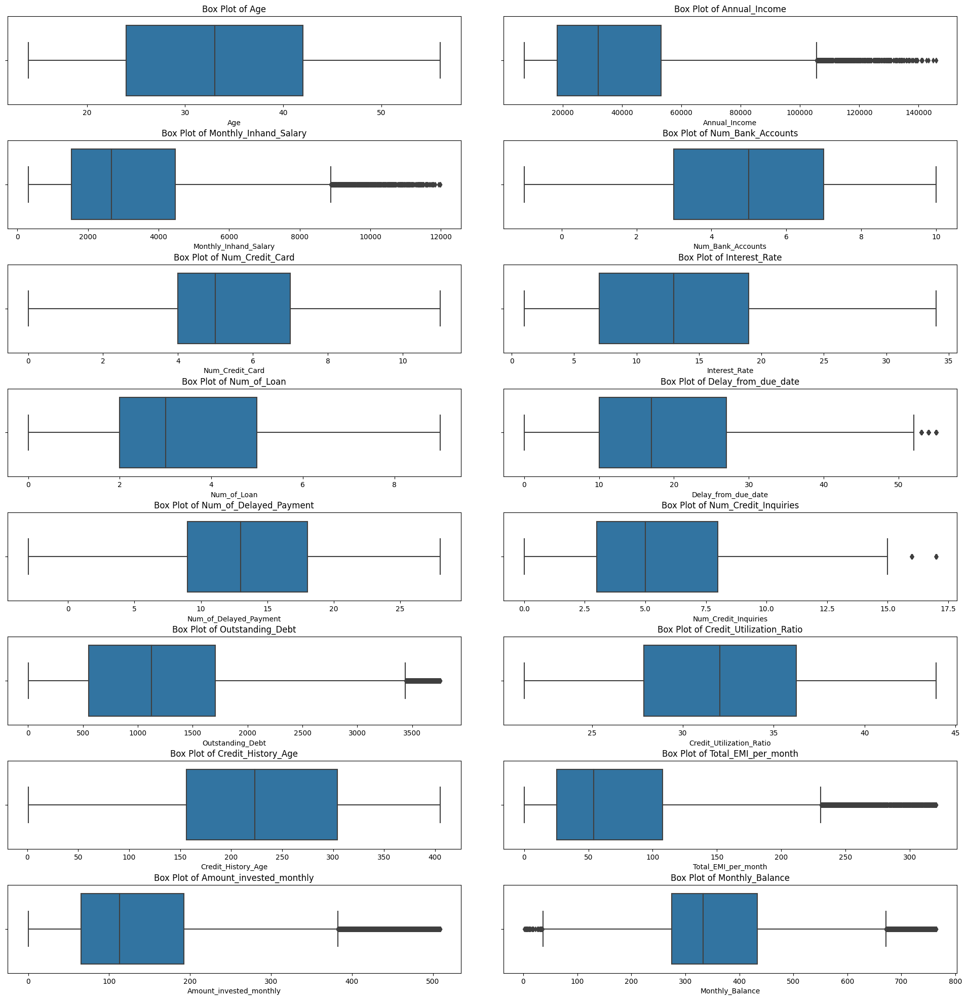

In [177]:
#lets verify whether outliers are removed or not visually

# Calculate the number of rows and columns for the subplot grid
num_cols = len(cols)
num_rows = (num_cols - 1) // 2 + 1

# Create a grid of subplots
fig, axes = plt.subplots(num_rows, 2, figsize=(20, 20))
fig.tight_layout(pad=3.0)  # Adjust the spacing between subplots

# Loop through each column and create a box plot in the corresponding subplot
for i, col in enumerate(cols):
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    sns.boxplot(data=df1, x=col, ax=ax)
    ax.set_title(f"Box Plot of {col}")

# Remove any unused subplots
for i in range(len(cols), num_rows * 2):
    fig.delaxes(axes.flatten()[i])

plt.show()

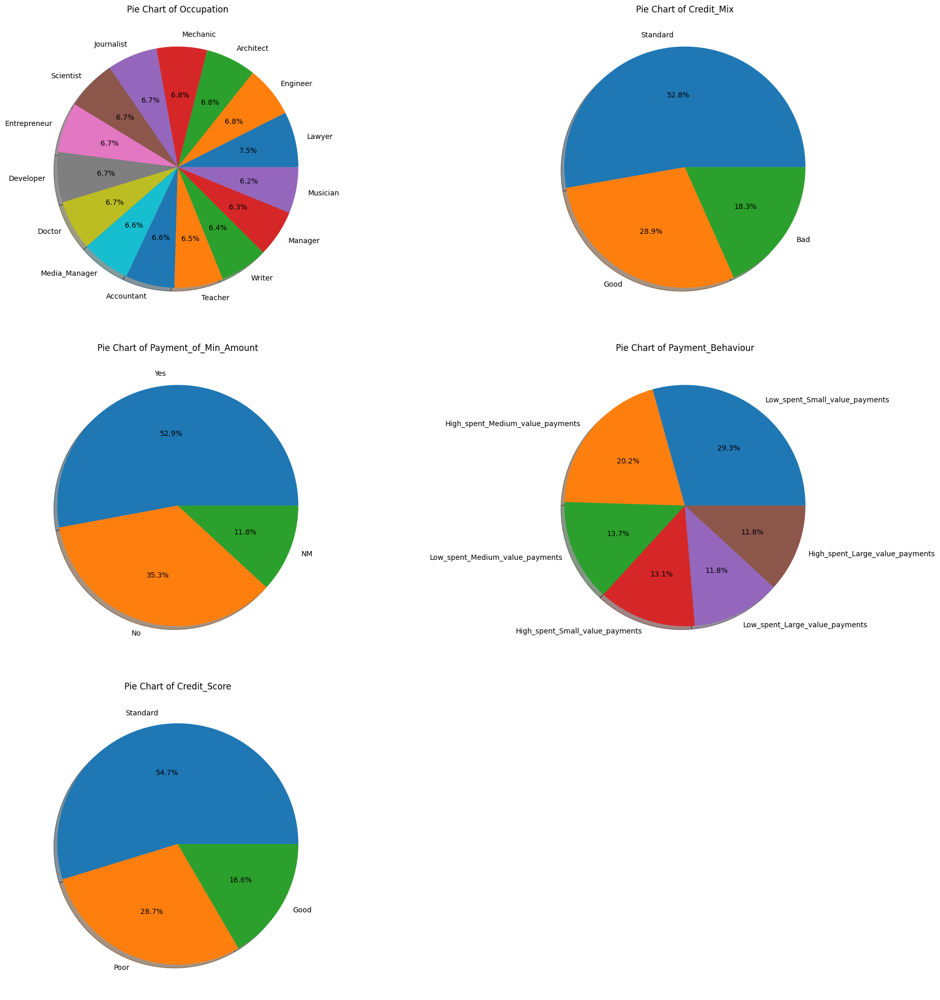

In [178]:
#lets verify if the dataset has unbalance or balanced classes

#quantifying classes seeing how balanced they are in terms of pie chart

categories = ['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount' , 'Payment_Behaviour' , 'Credit_Score']

# Calculate the number of rows and columns for the subplot grid
num_cols = len(categories)
num_rows = (num_cols - 1) // 2 + 1

# Create a grid of subplots
fig, axes = plt.subplots(num_rows, 2, figsize=(20, 20))
fig.tight_layout(pad=3.0)  # Adjust the spacing between subplots

# Loop through each column and create a pie chart in the corresponding subplot
for i, col in enumerate(categories):
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    label = df1[col].value_counts().index
    label_count = df1[col].value_counts().values
    ax.pie(label_count, labels=label, autopct='%1.1f%%', shadow=True, radius=1)

    ax.set_title(f"Pie Chart of {col}")

# Remove any unused subplots
for i in range(len(categories), num_rows * 2):
    fig.delaxes(axes.flatten()[i])

plt.show()

<Axes: >

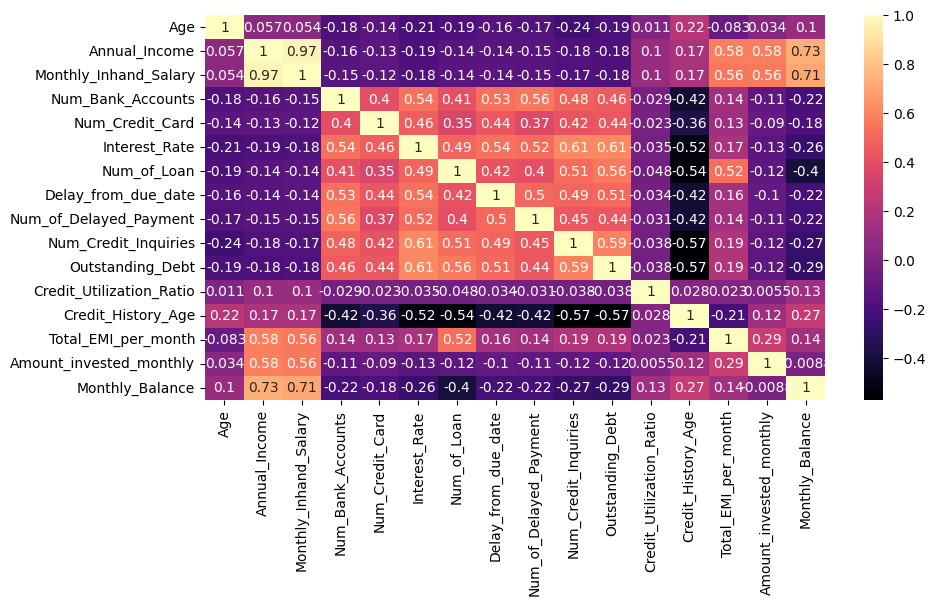

In [179]:
#from above plot most the categories look quite balanced though there is bit of non-balanced
#behaviour for credit_score but we will tackle this later

#lets see how these features are independent or correlated to each other
plt.figure(figsize=(10,5))
c= df1[cols].corr()
sns.heatmap(c,cmap="magma",annot=True)

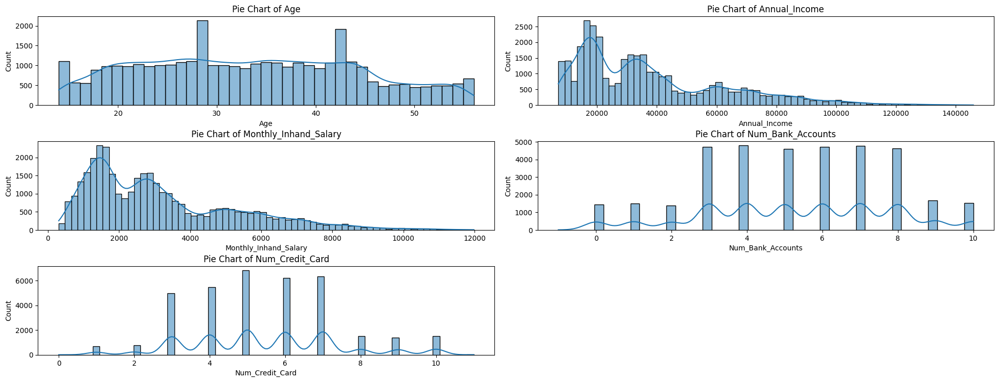

In [180]:
#lets plot distribution plot for each of these numerical features to measure their skewness and kurtoisis
# Calculate the number of rows and columns for the subplot grid
num_cols = len(cols)
num_rows = (num_cols - 1) // 2 + 1

# Create a grid of subplots
fig, axes = plt.subplots(num_rows, 2, figsize=(20, 20))
fig.tight_layout(pad=3.0)  # Adjust the spacing between subplots

# Loop through each column and create a pie chart in the corresponding subplot
for i, col in enumerate(cols):
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    sns.histplot(df1[col],kde = True , ax=ax)
    ax.set_title(f"Pie Chart of {col}")

# Remove any unused subplots
for i in range(len(categories), num_rows * 2):
    fig.delaxes(axes.flatten()[i])

plt.show()

In [181]:
#here some of plots shows they are highly skewed and need to be normalised and brought to same scale
#to measure their noiseness at same level

#before that lets perform label encoding  and one-hot encoding first and then touch upon this.
categories = ['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount' , 'Payment_Behaviour' , 'Credit_Score']
df1['Credit_Mix'].unique()

array(['Good', 'Standard', 'Bad'], dtype=object)

In [182]:
df1['Payment_Behaviour'].unique()

array(['Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments',
       'High_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Large_value_payments',
       'High_spent_Small_value_payments'], dtype=object)

In [183]:
df1['Credit_Score'].unique()

array(['Good', 'Standard', 'Poor'], dtype=object)

In [184]:
df1['Occupation'].unique()

array(['Scientist', 'Teacher', 'Entrepreneur', 'Developer', 'Lawyer',
       'Media_Manager', 'Doctor', 'Journalist', 'Engineer', 'Manager',
       'Accountant', 'Musician', 'Mechanic', 'Writer', 'Architect'],
      dtype=object)

In [185]:
df1['Payment_of_Min_Amount'].unique()

array(['No', 'NM', 'Yes'], dtype=object)

In [186]:
#Label encoding for dependent variable i.e Credit Score

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1['Credit_Score'] = le.fit_transform(df1['Credit_Score'])
df1['Credit_Score'].unique()

array([0, 2, 1])

In [187]:
#One hot encoding for other categorical variables

df1 = pd.get_dummies(df1, columns=['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount' , 'Payment_Behaviour'])
df2 = pd.get_dummies(df2, columns=['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount' , 'Payment_Behaviour'])


In [188]:
#dropping non-necessary features to our model
df2 = df2.drop(['ID','Customer_ID','Name','SSN','Type_of_Loan','Month'], axis = 1)

In [189]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35703 entries, 3 to 99991
Data columns (total 51 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   ID                                                  35703 non-null  object 
 1   Customer_ID                                         35703 non-null  object 
 2   Month                                               35703 non-null  object 
 3   Name                                                32116 non-null  object 
 4   Age                                                 35703 non-null  float64
 5   SSN                                                 35703 non-null  object 
 6   Annual_Income                                       35703 non-null  float64
 7   Monthly_Inhand_Salary                               35703 non-null  float64
 8   Num_Bank_Accounts                                   35703 non-null  int64  


In [190]:
#split the dataset into train_data as X & y

X = df1.drop(['ID','Customer_ID','Name','SSN','Type_of_Loan','Credit_Score','Month'], axis = 1)
y = df1['Credit_Score']

X[X<0] = 0

In [191]:
X.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Credit_Mix_Standard,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Large_value_payments,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments
3,23.0,19114.12,1824.843333,3,4,3,4.0,5,4.0,6.27,...,0,0,1,0,0,0,0,0,0,1
6,23.0,19114.12,1824.843333,3,4,3,4.0,3,8.0,11.27,...,0,0,1,0,0,0,0,0,0,1
7,23.0,19114.12,1824.843333,3,4,3,4.0,3,6.0,11.27,...,0,0,1,0,0,1,0,0,0,0
8,28.0,34847.84,3037.986667,2,4,6,1.0,3,4.0,5.42,...,0,0,1,0,0,0,0,0,0,1
9,28.0,34847.84,3037.986667,2,4,6,1.0,7,1.0,7.42,...,0,0,1,0,1,0,0,0,0,0


In [192]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35703 entries, 3 to 99991
Data columns (total 44 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Age                                                 35703 non-null  float64
 1   Annual_Income                                       35703 non-null  float64
 2   Monthly_Inhand_Salary                               35703 non-null  float64
 3   Num_Bank_Accounts                                   35703 non-null  int64  
 4   Num_Credit_Card                                     35703 non-null  int64  
 5   Interest_Rate                                       35703 non-null  int64  
 6   Num_of_Loan                                         35703 non-null  float64
 7   Delay_from_due_date                                 35703 non-null  int64  
 8   Num_of_Delayed_Payment                              35703 non-null  float64


In [193]:
# let's do feature selection using a chi-squared (chi²) statistical test for non-negative features to select k (k=10) of the best features

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X_sample = X
y_sample = y

#lets eliminate negative values
X_sample[X_sample<0] = 0

#apply SelectKBest class to extract top 10 best features

BestFeatures = SelectKBest(score_func=chi2, k=10)
fit = BestFeatures.fit(X_sample,y_sample)

df_scores = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(X.columns)

#concatenating two dataframes for better visualization

# feature scores
f_Scores = pd.concat([df_columns,df_scores],axis=1)
f_Scores.columns = ['Specs','Score']

# Score value is directly proportional to the feature importance
f_Scores

,Specs,Score
0,Age,3.001881e+03
1,Annual_Income,8.457350e+06
2,Monthly_Inhand_Salary,6.510672e+05
3,Num_Bank_Accounts,6.012567e+03
4,Num_Credit_Card,4.038978e+03
5,Interest_Rate,4.486466e+04
6,Num_of_Loan,6.195091e+03
7,Delay_from_due_date,5.265241e+04
8,Num_of_Delayed_Payment,1.317479e+04
9,Changed_Credit_Limit,6.820308e+03


In [194]:
# print 10 best features in descending order
print(f_Scores.nlargest(10,'Score'))

                      Specs         Score
1             Annual_Income  8.457350e+06
11         Outstanding_Debt  4.271230e+06
2     Monthly_Inhand_Salary  6.510672e+05
13       Credit_History_Age  2.065701e+05
16          Monthly_Balance  5.828992e+04
7       Delay_from_due_date  5.265241e+04
5             Interest_Rate  4.486466e+04
14      Total_EMI_per_month  3.090750e+04
10     Num_Credit_Inquiries  1.830206e+04
15  Amount_invested_monthly  1.327096e+04


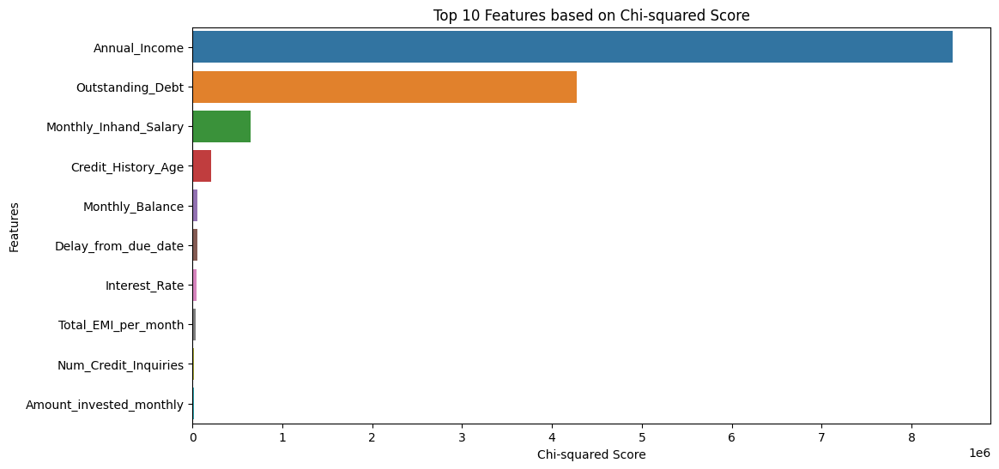

In [195]:
import numpy as np

# Sort the features by their scores in descending order
f_Scores = f_Scores.sort_values(by='Score', ascending=False)

# Create a bar plot to visualize feature scores
plt.figure(figsize=(12, 6))
sns.barplot(x='Score', y='Specs', data=f_Scores.head(10))  # Select the top 10 features
plt.title('Top 10 Features based on Chi-squared Score')
plt.xlabel('Chi-squared Score')
plt.ylabel('Features')
plt.show()

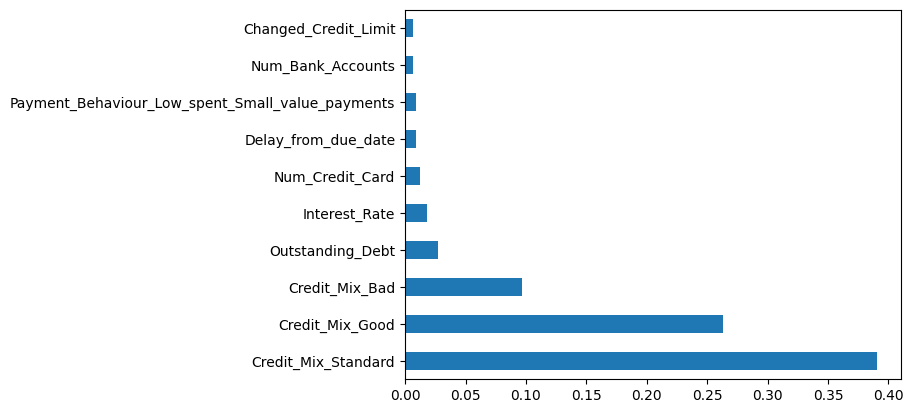

<Figure size 800x600 with 0 Axes>

In [196]:
#lets see each feature importance using XGB Classifier

import xgboost
import matplotlib.pyplot as plt

model_test = xgboost.XGBClassifier()
model_test.fit(X_sample,y)

feat_imp = pd.Series(model_test.feature_importances_, index=X_sample.columns)
feat_imp.nlargest(10).plot(kind='barh')

plt.figure(figsize=(8,6))
plt.show()

In [197]:
#Spliting the data into training and validation set

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [198]:
#feature scaling

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train.loc[:, :'Monthly_Balance'] = sc.fit_transform(X_train.loc[:, :'Monthly_Balance'])
X_test.loc[:, :'Monthly_Balance'] = sc.transform(X_test.loc[:, :'Monthly_Balance'])
df2.loc[:, :'Monthly_Balance'] = sc.transform(df2.loc[:, :'Monthly_Balance'])


# **Finally Model Building**

* XGBoost
* Logistic Regression
* Deep Neural Network
* Random Forest Classification
* Auto ML

In [201]:
# xgboost classisfier

from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
model_1 = XGBClassifier()
model_1.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [202]:
#testing & metrics of the model

y_pred = model_1.predict(X_test)
accuracy_score(y_test, y_pred)

0.7700602156560705

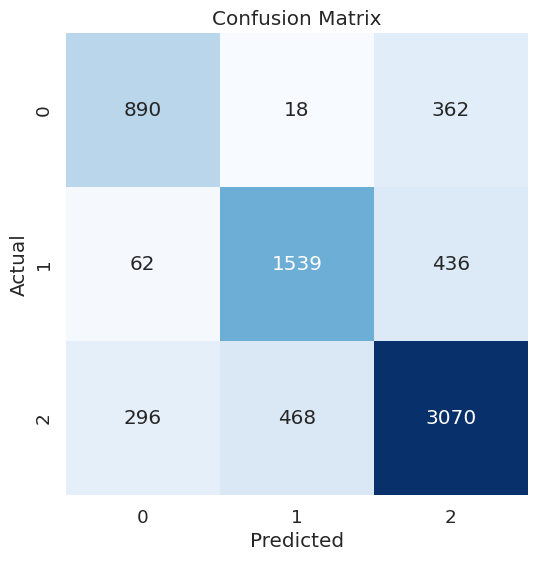

In [206]:
#evaluating the model
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

#plot this matrix
plt.figure(figsize=(6, 6))
sns.set(font_scale=1.2)  # Adjust font size if needed
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [231]:
#defining evaluation criteria for each model

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

def calculate_results(y_true, y_pred):
    results = {}

    # Calculate accuracy
    accuracy = accuracy_score(y_true, y_pred)
    results['Accuracy'] = accuracy

    # Calculate precision, recall, and F1-score
    precision = precision_score(y_true, y_pred,average = 'weighted')
    recall = recall_score(y_true, y_pred, average = 'weighted')
    f1 = f1_score(y_true, y_pred,average = 'weighted')
    results['Precision'] = precision
    results['Recall'] = recall
    results['F1 Score'] = f1

    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    results['Confusion Matrix'] = cm

    return results

results = calculate_results(y_test, y_pred)

print("Accuracy:", results['Accuracy'])
print("Precision:", results['Precision'])
print("Recall:", results['Recall'])
print("F1 Score:", results['F1 Score'])

Xgboost = {'accuracy': results['Accuracy'], 'precision': results['Precision'], 'recall': results['Recall'],'F1 Score' : results['F1 Score']}


Accuracy: 0.7965270970452317
Precision: 0.7965657662717692
Recall: 0.7965270970452317
F1 Score: 0.7965076117385503


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 0.6934602996779162
Precision: 0.6950030581559397
Recall: 0.6934602996779162
F1 Score: 0.6920612557708199


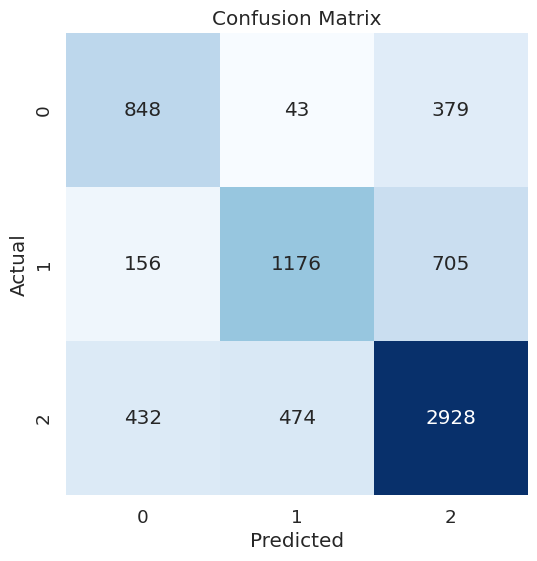

In [232]:
# logistic regression classifier

from sklearn.linear_model import LogisticRegression
model_2 = LogisticRegression()
model_2.fit(X_train, y_train)

#testing of model
y_pred = model_2.predict(X_test)

#evaluating metrics of model
results = calculate_results(y_test, y_pred)

print("Accuracy:", results['Accuracy'])
print("Precision:", results['Precision'])
print("Recall:", results['Recall'])
print("F1 Score:", results['F1 Score'])

cm = results['Confusion Matrix']

#plotting confusion matrix

plt.figure(figsize=(6, 6))
sns.set(font_scale=1.2)  # Adjust font size if needed
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Logistic_Regression = {'accuracy': results['Accuracy'], 'precision': results['Precision'], 'recall': results['Recall'],'F1 Score' : results['F1 Score']}


In [212]:
#lets build DNN Architecture

import tensorflow as tf
from tensorflow.keras import layers

model_3 = tf.keras.Sequential([
    layers.Dense(64, activation = 'relu'),
    layers.Dense(128, activation = 'relu'),
    layers.Dense(512, activation = 'relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(3, activation = 'softmax')

])

model_3.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])


In [213]:
history = model_3.fit(X_train, y_train, validation_data = (X_test,y_test), epochs = 10)


Epoch 1/10
893/893 [==============================] - 10s 8ms/step - loss: 0.7596 - accuracy: 0.6726 - val_loss: 0.6833 - val_accuracy: 0.6982
Epoch 2/10
893/893 [==============================] - 7s 8ms/step - loss: 0.6727 - accuracy: 0.7064 - val_loss: 0.6788 - val_accuracy: 0.6988
Epoch 3/10
893/893 [==============================] - 6s 6ms/step - loss: 0.6558 - accuracy: 0.7132 - val_loss: 0.6523 - val_accuracy: 0.7258
Epoch 4/10
893/893 [==============================] - 8s 9ms/step - loss: 0.6486 - accuracy: 0.7166 - val_loss: 0.6559 - val_accuracy: 0.7216
Epoch 5/10
893/893 [==============================] - 5s 6ms/step - loss: 0.6383 - accuracy: 0.7250 - val_loss: 0.6515 - val_accuracy: 0.7205
Epoch 6/10
893/893 [==============================] - 6s 7ms/step - loss: 0.6307 - accuracy: 0.7256 - val_loss: 0.6543 - val_accuracy: 0.7154
Epoch 7/10
893/893 [==============================] - 6s 7ms/step - loss: 0.6252 - accuracy: 0.7295 - val_loss: 0.6678 - val_accuracy: 0.7216
Epoch

<ipython-input-219-cd5d392f6c1a>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')  # White grid style


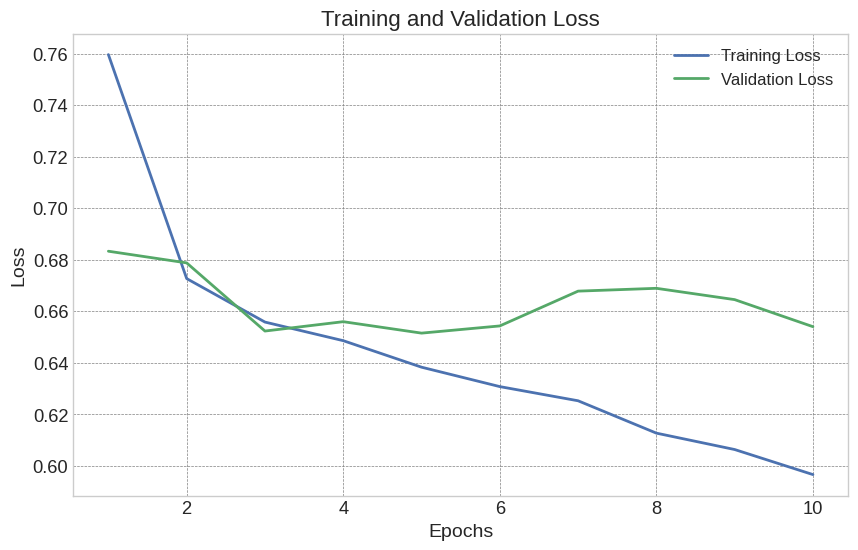

In [219]:
import matplotlib.pyplot as plt

def plot_loss_curves(history):
    # Extract loss values from the history object
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Get the number of epochs
    epochs = range(1, len(train_loss) + 1)

    # Plot the training and validation loss with styling
    plt.figure(figsize=(10, 6))

    # Styling options
    plt.style.use('seaborn-whitegrid')  # White grid style
    plt.plot(epochs, train_loss, 'b', label='Training Loss', linewidth=2)
    plt.plot(epochs, val_loss, 'g', label='Validation Loss', linewidth=2)

    # Add labels and title
    plt.title('Training and Validation Loss', fontsize=16)
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Loss', fontsize=14)

    # Add legend and grid
    plt.legend(fontsize=12)
    plt.grid(True, color='gray', linestyle='--', linewidth=0.5)

    plt.show()

plot_loss_curves(history)

<ipython-input-222-7ec5c8cc2244>:13: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')  # White grid style


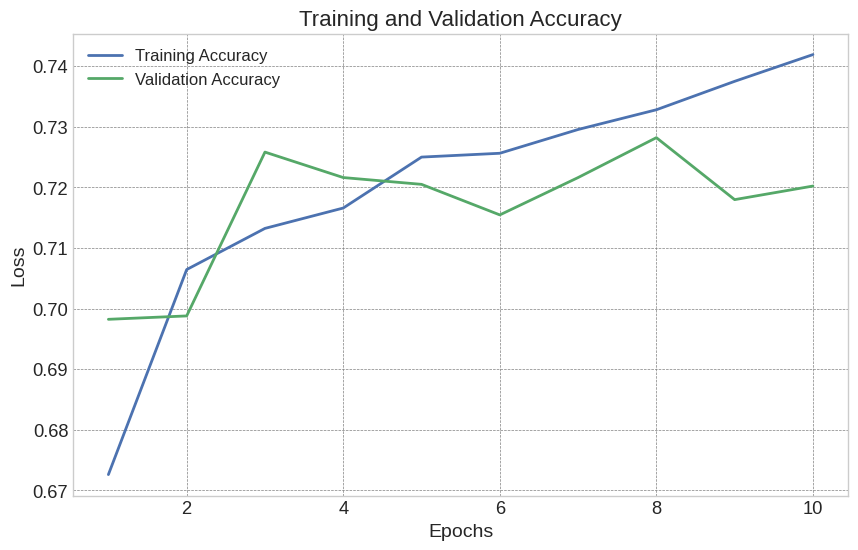

In [222]:
def plot_accuracy_curve(history):
    # Extract loss values from the history object
    train_loss = history.history['accuracy']
    val_loss = history.history['val_accuracy']

    # Get the number of epochs
    epochs = range(1, len(train_loss) + 1)

    # Plot the training and validation loss with styling
    plt.figure(figsize=(10, 6))

    # Styling options
    plt.style.use('seaborn-whitegrid')  # White grid style
    plt.plot(epochs, train_loss, 'b', label='Training Accuracy', linewidth=2)
    plt.plot(epochs, val_loss, 'g', label='Validation Accuracy', linewidth=2)

    # Add labels and title
    plt.title('Training and Validation Accuracy', fontsize=16)
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Loss', fontsize=14)

    # Add legend and grid
    plt.legend(fontsize=12)
    plt.grid(True, color='gray', linestyle='--', linewidth=0.5)

    plt.show()

plot_accuracy_curve(history)

In [233]:
#reinterating predictions for evaluation criteria
y_prob = model_3.predict(X_test)
y_pred = tf.argmax(y_prob, axis = 1)

224/224 [==============================] - 0s 2ms/step


Accuracy: 0.7202072538860104
Precision: 0.723905061556606
Recall: 0.7202072538860104
F1 Score: 0.7211892326115134


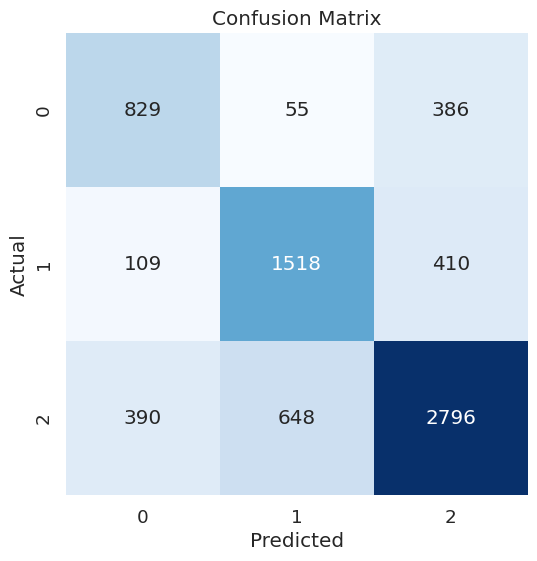

In [234]:
#evaluating metrics of model
results = calculate_results(y_test, y_pred)

print("Accuracy:", results['Accuracy'])
print("Precision:", results['Precision'])
print("Recall:", results['Recall'])
print("F1 Score:", results['F1 Score'])

cm = results['Confusion Matrix']

#plotting confusion matrix

plt.figure(figsize=(6, 6))
sns.set(font_scale=1.2)  # Adjust font size if needed
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

DNN = {'accuracy': results['Accuracy'], 'precision': results['Precision'], 'recall': results['Recall'],'F1 Score' : results['F1 Score']}


In [228]:
#random forest classifier

from sklearn.ensemble import RandomForestClassifier
model_4 = RandomForestClassifier(n_estimators=1500,criterion='entropy',random_state = 42)
model_4.fit(X_train, y_train)


RandomForestClassifier(criterion='entropy', n_estimators=1500, random_state=42)

Accuracy: 0.7965270970452317
Precision: 0.7965657662717692
Recall: 0.7965270970452317
F1 Score: 0.7965076117385503


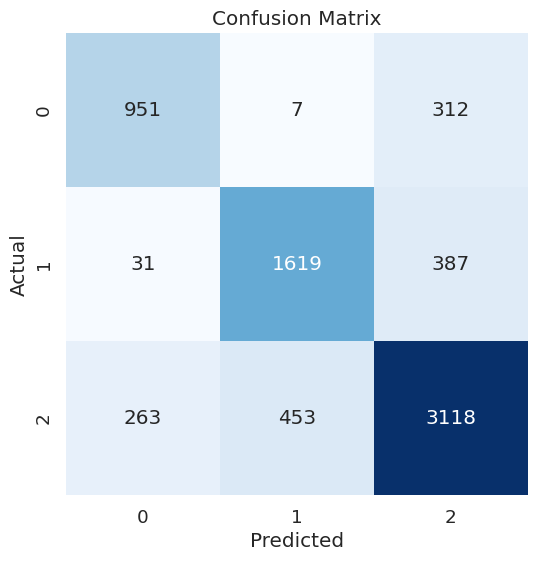

In [235]:
#testing of model
y_pred = model_4.predict(X_test)

#evaluating metrics of model
results = calculate_results(y_test, y_pred)

print("Accuracy:", results['Accuracy'])
print("Precision:", results['Precision'])
print("Recall:", results['Recall'])
print("F1 Score:", results['F1 Score'])

cm = results['Confusion Matrix']

#plotting confusion matrix

plt.figure(figsize=(6, 6))
sns.set(font_scale=1.2)  # Adjust font size if needed
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Random_Forest = {'accuracy': results['Accuracy'], 'precision': results['Precision'], 'recall': results['Recall'],'F1 Score' : results['F1 Score']}


In [236]:
#Creating a dataframe to summarise which model have performed better

model_perf = pd.DataFrame({"XGBoost":Xgboost,"Logistic Regression":Logistic_Regression,"Deep Neural Network":DNN, "Random Forest":Random_Forest})
model_perf = model_perf.transpose()
model_perf.sort_values(by=['accuracy'],ascending=False)


,accuracy,precision,recall,F1 Score
XGBoost,0.796527,0.796566,0.796527,0.796508
Random Forest,0.796527,0.796566,0.796527,0.796508
Deep Neural Network,0.720207,0.723905,0.720207,0.721189
Logistic Regression,0.693460,0.695003,0.693460,0.692061


In [239]:
#LETS compare and automate all INBUILT models using  AutoML from pycaret

from pycaret.classification import compare_models, setup
import seaborn as sns

sns.set_palette("autumn")

setup(data=X, target=y, session_id=123)

best_models = compare_models()

,Description,Value
0,Session id,123
1,Target,Credit_Score
2,Target type,Multiclass
3,Original data shape,"(35703, 45)"
4,Transformed data shape,"(35703, 45)"
5,Transformed train set shape,"(24992, 45)"
6,Transformed test set shape,"(10711, 45)"
7,Numeric features,44
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7880,0.8866,0.7880,0.7890,0.7883,0.6425,0.6426,7.7470
et,Extra Trees Classifier,0.7825,0.8832,0.7825,0.7834,0.7827,0.6324,0.6325,5.6170
xgboost,Extreme Gradient Boosting,0.7675,0.8753,0.7675,0.7682,0.7677,0.6067,0.6069,23.6570
lightgbm,Light Gradient Boosting Machine,0.7603,0.8709,0.7603,0.7636,0.7613,0.5977,0.5982,6.0670
gbc,Gradient Boosting Classifier,0.7398,0.8548,0.7398,0.7452,0.7413,0.5641,0.5649,31.7140
dt,Decision Tree Classifier,0.7022,0.7416,0.7022,0.7026,0.7022,0.4961,0.4962,0.6200
ada,Ada Boost Classifier,0.6981,0.7526,0.6981,0.7004,0.6975,0.4851,0.4864,2.7640
lda,Linear Discriminant Analysis,0.6913,0.8147,0.6913,0.7235,0.6966,0.5066,0.5157,0.3780
ridge,Ridge Classifier,0.6882,0.0000,0.6882,0.7077,0.6918,0.4901,0.4946,0.1230
nb,Naive Bayes,0.6557,0.7724,0.6557,0.7174,0.6643,0.4715,0.4910,0.1300


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

# **Make actual predictions on unseen real-world test data**

* Well It's seems like Random Forest is a clean winner. So, this model will be our best performing model so far.
* Now its time to test this high performing model into action where we are going test this model on our unseen test data and predicted credit score and add to our df2 data frame.

In [240]:
#model_4 : RandomForestClassifier
y_pred = model_4.predict(df2)

In [248]:
#Performing inverse transformation dependent variable i.e Credit Score from numeric class to string class i.e good,bad, standard
df2


,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Credit_Mix_Standard,Payment_of_Min_Amount_NM,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Large_value_payments,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments
1,-0.857969,-0.759065,-0.647203,-0.926176,-0.726071,-1.320923,0.274341,-1.302276,-0.694898,0.518725,...,0,0,1,0,0,1,0,0,0,0
2,-0.857969,-0.759065,-0.647203,-0.926176,-0.726071,-1.320923,0.274341,-1.540499,-1.524538,0.356379,...,0,0,1,0,0,0,0,0,1,0
3,-0.857969,-0.759065,-0.647203,-0.926176,-0.726071,-1.320923,0.274341,-1.222868,-1.358610,0.194034,...,0,0,1,0,0,1,0,0,0,0
4,-0.488906,-0.134651,-0.076614,-1.327607,-0.726071,-0.966334,-1.056605,-1.302276,-2.022323,-0.755687,...,0,0,1,0,1,0,0,0,0,0
5,-0.488906,-0.134651,-0.076614,-1.327607,-0.726071,-0.966334,-1.056605,-1.302276,-1.690467,-0.755687,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49984,1.079611,-0.855653,-0.786806,-1.729037,-2.229444,-1.084530,0.274341,-1.461091,-2.188251,-0.711854,...,0,0,1,0,0,0,0,0,1,0
49992,-0.396640,-0.723794,-0.597787,1.883835,1.278427,1.752186,0.717990,1.079955,1.959953,1.336946,...,0,0,0,1,0,0,0,0,0,1
49993,-0.396640,-0.723794,-0.597787,1.883835,1.278427,1.752186,0.717990,1.079955,1.959953,1.336946,...,0,0,0,1,0,0,0,0,0,1
49994,-0.396640,-0.723794,-0.597787,1.883835,1.278427,1.752186,0.717990,1.079955,1.462169,1.336946,...,0,0,0,1,0,0,1,0,0,0


In [242]:
#Creating a dataframe which we gonna merge with df2
prediction = pd.DataFrame(y_pred_1, columns = ['Credit score (Predicted)'])

In [243]:
#prediction column overview
prediction

,Credit score (Predicted)
0,Standard
1,Good
2,Standard
3,Good
4,Good
...,...
17762,Good
17763,Poor
17764,Poor
17765,Poor
